<div style="text-align:center;">
<img src="https://www.widsworldwide.org/wp-content/uploads/2023/09/WiDS_Logo_Mobile.png" alt="Logo" width="600" height="400">

# WiDS Datathon 2024 Challenge #1
# Bridging Healthcare Gaps: Predicting Timely Treatment🩺

</div>

# <div style="padding: 30px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#FFCE30"><b><span style='color:#FFFFFF'>1 |</span></b> <b>INTRODUCTION</b></div>

- The dataset focuses on patients diagnosed with metastatic triple negative breast cancers, a highly aggressive form of the disease.
- In our quest to address healthcare disparities, we leverage deep learning techniques, particularly on the 67 columns of demographic data intricately connected to patient zip codes.
- Our goal is to uncover hidden patterns and relationships that can inform targeted interventions and advancements in breast cancer care.
- Through EDA, we aim to extract profound insights from this valuable dataset using this notebook.

### <b><span style='color:#FFCE30'> 1.1 |</span> Background: Equity in Healthcare</b>

# <div style="padding: 30px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#FFCE30"><b><span style='color:#FFFFFF'>2 |</span></b> <b>IMPORT & LOAD DATA</b></div>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# Set the display options to show all columns without truncation
pd.set_option('display.max_columns', None)

In [2]:
# Use Jupyter Widges Package - https://ipywidgets.readthedocs.io/en/stable/index.html 
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual, Layout
import ipywidgets as widgets
style = {'description_width': 'initial'}

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 300)

In [3]:
#Load the data
train = pd.read_csv("/kaggle/input/widsdatathon2024-challenge1/training.csv")
test = pd.read_csv("/kaggle/input/widsdatathon2024-challenge1/test.csv")
sample_submission = pd.read_csv("/kaggle/input/widsdatathon2024-challenge1/sample_submission.csv")

# <div style="padding: 30px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#FFCE30"><b><span style='color:#FFFFFF'>3 |</span></b> <b>EDA ON DEMOGRAPHICS + ENVIRONMENTAL FEATURES</b></div>

In [4]:
selected_columns = [
    'patient_zip3', 'Region', 'Division', 'population', 'density', 'age_median', 'age_under_10', 'age_10_to_19',
    'age_20s', 'age_30s', 'age_40s', 'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male', 'female', 'married',
    'divorced', 'never_married', 'widowed', 'family_size', 'family_dual_income', 'income_household_median',
    'income_household_under_5', 'income_household_5_to_10', 'income_household_10_to_15', 'income_household_15_to_20',
    'income_household_20_to_25', 'income_household_25_to_35', 'income_household_35_to_50', 'income_household_50_to_75',
    'income_household_75_to_100', 'income_household_100_to_150', 'income_household_150_over', 'income_household_six_figure',
    'income_individual_median', 'home_ownership', 'housing_units', 'home_value', 'rent_median', 'rent_burden',
    'education_less_highschool', 'education_highschool', 'education_some_college', 'education_bachelors', 'education_graduate',
    'education_college_or_above', 'education_stem_degree', 'labor_force_participation', 'unemployment_rate', 'self_employed',
    'farmer', 'race_white', 'race_black', 'race_asian', 'race_native', 'race_pacific', 'race_other', 'race_multiple',
    'hispanic', 'disabled', 'poverty', 'limited_english', 'commute_time', 'health_uninsured', 'veteran', 'Ozone', 'PM25', 'N02'
]

train_demo = train[selected_columns]
train_demo

,patient_zip3,Region,Division,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02
0,924,West,Pacific,31437.75000,1189.562500,30.642857,16.014286,15.542857,17.614286,14.014286,11.614286,11.557143,7.571429,4.000000,2.100000,49.857143,50.142857,36.571429,11.885714,47.114286,4.442857,3.928571,52.228571,52996.28571,3.142857,4.000000,6.157143,5.142857,6.271429,10.142857,13.300000,20.000000,12.742857,11.571429,7.528571,19.100000,24563.57143,44.585714,8674.500000,2.646343e+05,1165.000000,37.442857,33.257143,29.200000,25.914286,8.357143,3.257143,11.614286,39.557143,61.528571,8.471429,13.428571,0.000000,44.100000,13.100000,5.100000,1.485714,0.342857,27.114286,8.757143,66.685714,12.871429,22.542857,10.100000,27.814286,11.200000,3.500000,52.237210,8.650555,18.606528
1,928,West,Pacific,39121.87879,2295.939394,38.200000,11.878788,13.354545,14.230303,13.418182,13.333333,14.060606,10.248485,5.951515,3.503030,49.893939,50.106061,50.245455,9.827273,35.290909,4.651515,3.622727,61.736364,102741.63640,2.327273,1.536364,2.648485,2.178788,2.409091,5.163636,7.972727,13.936364,12.469697,19.760606,29.596970,49.357576,41287.27273,61.463636,11725.666670,6.776885e+05,2003.125000,34.753125,14.230303,19.987879,29.796970,23.739394,12.245455,35.984848,47.918182,65.230303,5.103030,15.224242,0.027273,54.030303,2.527273,20.827273,0.587879,0.300000,11.645455,10.081818,37.948485,8.957576,10.109091,8.057576,30.606061,7.018182,4.103030,42.301121,8.487175,20.113179
2,760,South,West South Central,21996.68333,626.236667,37.906667,13.028333,14.463333,12.531667,13.545000,12.860000,12.770000,11.426667,6.565000,2.811667,50.123333,49.876667,55.753333,12.330000,27.195000,4.710000,3.260667,55.801667,85984.74138,2.483333,1.305000,2.716667,2.938333,2.766667,6.763333,12.061667,15.835000,13.560000,20.875000,18.680000,39.555000,40399.03333,72.745000,7786.583333,2.377131e+05,1235.907407,29.358491,10.811667,27.038333,32.368333,19.678333,10.115000,29.793333,37.308475,66.428333,4.560000,13.722034,3.650847,75.820000,9.231667,3.618333,0.463333,0.146667,3.816667,6.898333,19.370000,11.253333,9.663333,3.356667,31.394915,15.066667,7.446667,40.108207,7.642753,14.839351
3,926,West,Pacific,32795.32558,1896.220930,42.871429,10.071429,12.135714,12.538095,12.464286,12.650000,14.847619,12.280952,8.216667,4.759524,49.066667,50.933333,52.604762,11.623810,31.142857,4.623810,3.098095,54.564286,120533.83330,3.435714,1.273810,2.180952,2.211905,2.100000,4.380952,5.885714,10.897619,10.721429,18.850000,38.057143,56.907143,55336.28571,59.221429,12171.302330,1.012474e+06,2354.738095,32.030952,5.835714,12.145238,26.269048,33.285714,22.459524,55.745238,48.938095,64.430952,5.264286,18.502381,0.052381,65.014286,1.438095,18.845238,0.430952,0.252381,5.428571,8.611905,16.716667,8.845238,8.688095,5.280952,27.561905,4.404762,4.809524,42.070075,7.229393,15.894123
4,836,West,Mountain,10886.26000,116.886000,43.473469,10.824000,13.976000,9.492000,10.364000,12.600000,14.992000,14.836000,9.462000,3.466000,52.312000,47.688000,57.882000,14.964000,21.760000,5.406000,3.3

In [5]:
#Groupby zip code for all the available demographic data. zip code should be the unique identifier

train_demo_grouped = train_demo.groupby('patient_zip3').first().reset_index()
train_demo_grouped

,patient_zip3,Region,Division,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02
0,101,Northeast,Middle Atlantic,2746.136364,5363.172727,41.250000,13.850000,6.750000,10.800000,16.950000,15.400000,8.500000,10.850000,8.750000,8.150000,42.550000,57.450000,46.350000,10.400000,35.450000,7.850000,2.845000,46.400000,113609.50000,0.750000,1.900000,1.350000,7.750000,1.100000,5.350000,1.700000,4.950000,24.800000,14.850000,35.500000,50.350000,88910.50000,15.850000,1389.045455,1.178137e+06,2701.500000,31.900000,5.000000,16.650000,7.200000,38.350000,32.750000,71.100000,38.350000,68.800000,2.500000,20.860000,0.020000,85.250000,2.550000,6.400000,0.050000,0.000000,2.500000,3.300000,15.650000,19.350000,4.150000,1.150000,27.850000,5.400000,1.200000,39.476275,4.178836,4.131900
1,103,Northeast,Middle Atlantic,37938.000000,3697.284615,39.866667,11.608333,13.141667,12.725000,12.783333,13.233333,14.116667,12.383333,6.583333,3.441667,49.158333,50.841667,49.433333,9.866667,35.000000,5.700000,3.461667,55.216667,90381.91667,4.125000,2.241667,3.583333,2.766667,2.458333,5.691667,8.141667,14.716667,10.741667,19.091667,26.466667,45.558333,42708.58333,67.341667,13040.615380,5.681772e+05,1463.750000,34.941667,11.950000,29.733333,24.016667,20.716667,13.608333,34.325000,44.508333,59.850000,5.233333,12.958333,0.000000,67.875000,12.191667,8.691667,0.358333,0.033333,4.725000,6.100000,20.458333,9.916667,10.925000,6.441667,44.791667,4.583333,3.283333,38.718935,7.299229,22.112395
2,104,Northeast,Middle Atlantic,58934.160000,16936.584000,36.216000,13.464000,13.308000,15.064000,13.668000,12.460000,12.612000,9.596000,6.036000,3.752000,47.384000,52.616000,32.316000,14.188000,47.872000,5.624000,3.391600,45.588000,50831.96000,6.024000,5.560000,8.628000,5.860000,5.424000,9.280000,12.164000,15.188000,9.808000,11.568000,10.512000,22.080000,27712.36000,23.280000,21012.520000,4.229246e+05,1317.640000,41.364000,24.512000,27.484000,25.056000,14.236000,8.668000,22.904000,42.652000,58.956000,10.856000,16.052000,0.000000,24.148000,32.516000,3.520000,0.724000,0.124000,30.264000,8.704000,53.736000,16.100000,25.028000,15.920000,44.944000,7.468000,2.520000,36.555194,7.426677,29.089314
3,105,Northeast,Middle Atlantic,10690.730160,910.853968,43.488710,9.904839,15.264516,10.200000,10.850000,12.717742,15.353226,13.883871,7.404839,4.432258,51.059677,48.940323,53.558065,8.988710,32.967742,4.490323,3.212833,61.770000,147128.20690,1.970000,0.975000,1.503333,1.621667,2.046667,3.908333,5.835000,9.750000,9.385000,17.063333,45.946667,63.010000,57872.20000,75.790000,3801.952381,6.201969e+05,2061.173077,32.793333,7.298387,15.125806,18.840323,28.788710,29.954839,58.743548,43.140984,64.753226,7.064516,17.368852,0.000000,72.172581,7.654839,6.962903,0.167742,0.008065,8.129032,4.898387,15.898387,9.385484,7.851613,3.283333,36.808475,3.622581,3.967742,39.286219,6.634648,20.973690
4,106,Northeast,Middle Atlantic,14171.666670,2702.433333,40.583333,11.100000,11.466667,12.650000,13.883333,14.100000,13.850000,11.250000,7.383333,4.333333,48.400000,51.60000

In [6]:
# Add 4 summary columns of the summary statistics of the target variable in order to retain feature information about the zip codes

# Calculate counts and percentages for 'DiagPeriodL90D' for each 'patient_zip3'
count_1 = train[train['DiagPeriodL90D'] == 1].groupby('patient_zip3')['DiagPeriodL90D'].count().reset_index()
count_1.columns = ['patient_zip3', 'DiagPeriodL90D_Count_1']

count_0 = train[train['DiagPeriodL90D'] == 0].groupby('patient_zip3')['DiagPeriodL90D'].count().reset_index()
count_0.columns = ['patient_zip3', 'DiagPeriodL90D_Count_0']

total_count = train.groupby('patient_zip3')['DiagPeriodL90D'].count().reset_index()
total_count.columns = ['patient_zip3', 'DiagPeriodL90D_Total_Count']

# Merge the counts back to 'train_demo_grouped'
train_demo_grouped = pd.merge(train_demo_grouped, count_1, on='patient_zip3', how='left')
train_demo_grouped = pd.merge(train_demo_grouped, count_0, on='patient_zip3', how='left')
train_demo_grouped = pd.merge(train_demo_grouped, total_count, on='patient_zip3', how='left')

# Replace NaN with 0 for count columns
train_demo_grouped['DiagPeriodL90D_Count_1'].fillna(0, inplace=True)
train_demo_grouped['DiagPeriodL90D_Count_0'].fillna(0, inplace=True)

# Calculate percentages
train_demo_grouped['DiagPeriodL90D_Percentage_1'] = train_demo_grouped['DiagPeriodL90D_Count_1'] / train_demo_grouped['DiagPeriodL90D_Total_Count']
train_demo_grouped['DiagPeriodL90D_Percentage_0'] = train_demo_grouped['DiagPeriodL90D_Count_0'] / train_demo_grouped['DiagPeriodL90D_Total_Count']

train_demo_grouped


,patient_zip3,Region,Division,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D_Count_1,DiagPeriodL90D_Count_0,DiagPeriodL90D_Total_Count,DiagPeriodL90D_Percentage_1,DiagPeriodL90D_Percentage_0
0,101,Northeast,Middle Atlantic,2746.136364,5363.172727,41.250000,13.850000,6.750000,10.800000,16.950000,15.400000,8.500000,10.850000,8.750000,8.150000,42.550000,57.450000,46.350000,10.400000,35.450000,7.850000,2.845000,46.400000,113609.50000,0.750000,1.900000,1.350000,7.750000,1.100000,5.350000,1.700000,4.950000,24.800000,14.850000,35.500000,50.350000,88910.50000,15.850000,1389.045455,1.178137e+06,2701.500000,31.900000,5.000000,16.650000,7.200000,38.350000,32.750000,71.100000,38.350000,68.800000,2.500000,20.860000,0.020000,85.250000,2.550000,6.400000,0.050000,0.000000,2.500000,3.300000,15.650000,19.350000,4.150000,1.150000,27.850000,5.400000,1.200000,39.476275,4.178836,4.131900,2.0,0.0,2,1.000000,0.000000
1,103,Northeast,Middle Atlantic,37938.000000,3697.284615,39.866667,11.608333,13.141667,12.725000,12.783333,13.233333,14.116667,12.383333,6.583333,3.441667,49.158333,50.841667,49.433333,9.866667,35.000000,5.700000,3.461667,55.216667,90381.91667,4.125000,2.241667,3.583333,2.766667,2.458333,5.691667,8.141667,14.716667,10.741667,19.091667,26.466667,45.558333,42708.58333,67.341667,13040.615380,5.681772e+05,1463.750000,34.941667,11.950000,29.733333,24.016667,20.716667,13.608333,34.325000,44.508333,59.850000,5.233333,12.958333,0.000000,67.875000,12.191667,8.691667,0.358333,0.033333,4.725000,6.100000,20.458333,9.916667,10.925000,6.441667,44.791667,4.583333,3.283333,38.718935,7.299229,22.112395,21.0,14.0,35,0.600000,0.400000
2,104,Northeast,Middle Atlantic,58934.160000,16936.584000,36.216000,13.464000,13.308000,15.064000,13.668000,12.460000,12.612000,9.596000,6.036000,3.752000,47.384000,52.616000,32.316000,14.188000,47.872000,5.624000,3.391600,45.588000,50831.96000,6.024000,5.560000,8.628000,5.860000,5.424000,9.280000,12.164000,15.188000,9.808000,11.568000,10.512000,22.080000,27712.36000,23.280000,21012.520000,4.229246e+05,1317.640000,41.364000,24.512000,27.484000,25.056000,14.236000,8.668000,22.904000,42.652000,58.956000,10.856000,16.052000,0.000000,24.148000,32.516000,3.520000,0.724000,0.124000,30.264000,8.704000,53.736000,16.100000,25.028000,15.920000,44.944000,7.468000,2.520000,36.555194,7.426677,29.089314,65.0,48.0,113,0.575221,0.424779
3,105,Northeast,Middle Atlantic,10690.730160,910.853968,43.488710,9.904839,15.264516,10.200000,10.850000,12.717742,15.353226,13.883871,7.404839,4.432258,51.059677,48.940323,53.558065,8.988710,32.967742,4.490323,3.212833,61.770000,147128.20690,1.970000,0.975000,1.503333,1.621667,2.046667,3.908333,5.835000,9.750000,9.385000,17.063333,45.946667,63.010000,57872.20000,75.790000,3801.952381,6.201969e+05,2061.173077,32.793333,7.298387,15.125806,18.840323,28.788710,29.954839,58.743548,43.140984,64.753226,7.064516,17.368852,0.000000,72.172581,7.654839,6.962903,0.167742,0.008065,8.129032,4.898387,15.898387,9.385484,7.851613,3.283333,36.808475,

In [7]:
# Now we check if there is any duplicates in the demographics data group by ZIP code.
train_demo_grouped[train_demo_grouped.duplicated()]


,patient_zip3,Region,Division,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D_Count_1,DiagPeriodL90D_Count_0,DiagPeriodL90D_Total_Count,DiagPeriodL90D_Percentage_1,DiagPeriodL90D_Percentage_0


In [8]:
train_demo_grouped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 739 entries, 0 to 738
Data columns (total 75 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   patient_zip3                 739 non-null    int64  
 1   Region                       739 non-null    object 
 2   Division                     739 non-null    object 
 3   population                   738 non-null    float64
 4   density                      738 non-null    float64
 5   age_median                   738 non-null    float64
 6   age_under_10                 738 non-null    float64
 7   age_10_to_19                 738 non-null    float64
 8   age_20s                      738 non-null    float64
 9   age_30s                      738 non-null    float64
 10  age_40s                      738 non-null    float64
 11  age_50s                      738 non-null    float64
 12  age_60s                      738 non-null    float64
 13  age_70s             

In [9]:
train_demo_grouped.describe().T.style.background_gradient(cmap='Oranges').format("{:.2f}")

,count,mean,std,min,25%,50%,75%,max
patient_zip3,739.00,530.70,261.04,101.00,306.50,507.00,757.50,999.00
population,738.00,12224.45,10710.25,635.55,3928.00,8113.75,18330.95,71374.13
density,738.00,690.68,1576.61,0.92,53.18,166.61,718.72,21172.00
age_median,738.00,41.90,4.43,20.60,39.06,42.13,44.67,54.57
age_under_10,738.00,10.88,1.75,0.00,9.77,10.84,12.03,17.68
age_10_to_19,738.00,12.89,2.44,6.31,11.57,12.77,13.87,35.30
age_20s,738.00,12.50,4.03,5.92,10.28,11.46,13.56,62.10
age_30s,738.00,11.86,2.14,1.50,10.56,11.49,12.74,25.47
age_40s,738.00,11.59,1.43,0.80,10.71,11.64,12.53,17.82
age_50s,738.00,13.67,1.96,0.00,12.56,13.75,14.77,21.66


#### Apply for also Test set

In [10]:
test_demo = test[selected_columns]

#Groupby zip code for all the available demographic data. zip code should be the unique identifier

test_demo_grouped = test_demo.groupby('patient_zip3').first().reset_index()
test_demo_grouped

,patient_zip3,Region,Division,population,density,age_median,age_under_10,age_10_to_19,age_20s,age_30s,age_40s,age_50s,age_60s,age_70s,age_over_80,male,female,married,divorced,never_married,widowed,family_size,family_dual_income,income_household_median,income_household_under_5,income_household_5_to_10,income_household_10_to_15,income_household_15_to_20,income_household_20_to_25,income_household_25_to_35,income_household_35_to_50,income_household_50_to_75,income_household_75_to_100,income_household_100_to_150,income_household_150_over,income_household_six_figure,income_individual_median,home_ownership,housing_units,home_value,rent_median,rent_burden,education_less_highschool,education_highschool,education_some_college,education_bachelors,education_graduate,education_college_or_above,education_stem_degree,labor_force_participation,unemployment_rate,self_employed,farmer,race_white,race_black,race_asian,race_native,race_pacific,race_other,race_multiple,hispanic,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02
0,101,Northeast,Middle Atlantic,2746.136364,5363.172727,41.250000,13.850000,6.750000,10.800000,16.950000,15.400000,8.500000,10.850000,8.750000,8.150000,42.550000,57.450000,46.350000,10.400000,35.450000,7.850000,2.845000,46.400000,113609.50000,0.750000,1.900000,1.350000,7.750000,1.100000,5.350000,1.700000,4.950000,24.800000,14.850000,35.500000,50.350000,88910.50000,15.850000,1389.045455,1.178137e+06,2701.500000,31.900000,5.000000,16.650000,7.200000,38.350000,32.750000,71.100000,38.350000,68.800000,2.500000,20.860000,0.020000,85.250000,2.550000,6.400000,0.050000,0.000000,2.500000,3.300000,15.650000,19.350000,4.150000,1.150000,27.850000,5.400000,1.200000,39.476275,4.178836,4.131900
1,103,Northeast,Middle Atlantic,37938.000000,3697.284615,39.866667,11.608333,13.141667,12.725000,12.783333,13.233333,14.116667,12.383333,6.583333,3.441667,49.158333,50.841667,49.433333,9.866667,35.000000,5.700000,3.461667,55.216667,90381.91667,4.125000,2.241667,3.583333,2.766667,2.458333,5.691667,8.141667,14.716667,10.741667,19.091667,26.466667,45.558333,42708.58333,67.341667,13040.615380,5.681772e+05,1463.750000,34.941667,11.950000,29.733333,24.016667,20.716667,13.608333,34.325000,44.508333,59.850000,5.233333,12.958333,0.000000,67.875000,12.191667,8.691667,0.358333,0.033333,4.725000,6.100000,20.458333,9.916667,10.925000,6.441667,44.791667,4.583333,3.283333,38.718935,7.299229,22.112395
2,104,Northeast,Middle Atlantic,58934.160000,16936.584000,36.216000,13.464000,13.308000,15.064000,13.668000,12.460000,12.612000,9.596000,6.036000,3.752000,47.384000,52.616000,32.316000,14.188000,47.872000,5.624000,3.391600,45.588000,50831.96000,6.024000,5.560000,8.628000,5.860000,5.424000,9.280000,12.164000,15.188000,9.808000,11.568000,10.512000,22.080000,27712.36000,23.280000,21012.520000,4.229246e+05,1317.640000,41.364000,24.512000,27.484000,25.056000,14.236000,8.668000,22.904000,42.652000,58.956000,10.856000,16.052000,0.000000,24.148000,32.516000,3.520000,0.724000,0.124000,30.264000,8.704000,53.736000,16.100000,25.028000,15.920000,44.944000,7.468000,2.520000,36.555194,7.426677,29.089314
3,105,Northeast,Middle Atlantic,10690.730160,910.853968,43.488710,9.904839,15.264516,10.200000,10.850000,12.717742,15.353226,13.883871,7.404839,4.432258,51.059677,48.940323,53.558065,8.988710,32.967742,4.490323,3.212833,61.770000,147128.20690,1.970000,0.975000,1.503333,1.621667,2.046667,3.908333,5.835000,9.750000,9.385000,17.063333,45.946667,63.010000,57872.20000,75.790000,3801.952381,6.201969e+05,2061.173077,32.793333,7.298387,15.125806,18.840323,28.788710,29.954839,58.743548,43.140984,64.753226,7.064516,17.368852,0.000000,72.172581,7.654839,6.962903,0.167742,0.008065,8.129032,4.898387,15.898387,9.385484,7.851613,3.283333,36.808475,3.622581,3.967742,39.286219,6.634648,20.973690
4,106,Northeast,Middle Atlantic,14171.666670,2702.433333,40.583333,11.100000,11.466667,12.650000,13.883333,14.100000,13.850000,11.250000,7.383333,4.333333,48.400000,51.60000

#### Categorical features versus Numerical features

In [11]:
categorical_features = train_demo_grouped.select_dtypes('object').columns
numerical_features= train_demo_grouped.select_dtypes('number').columns

In [12]:
categorical_features

Index(['Region', 'Division'], dtype='object')

In [13]:
numerical_features

Index(['patient_zip3', 'population', 'density', 'age_median', 'age_under_10',
       'age_10_to_19', 'age_20s', 'age_30s', 'age_40s', 'age_50s', 'age_60s',
       'age_70s', 'age_over_80', 'male', 'female', 'married', 'divorced',
       'never_married', 'widowed', 'family_size', 'family_dual_income',
       'income_household_median', 'income_household_under_5',
       'income_household_5_to_10', 'income_household_10_to_15',
       'income_household_15_to_20', 'income_household_20_to_25',
       'income_household_25_to_35', 'income_household_35_to_50',
       'income_household_50_to_75', 'income_household_75_to_100',
       'income_household_100_to_150', 'income_household_150_over',
       'income_household_six_figure', 'income_individual_median',
       'home_ownership', 'housing_units', 'home_value', 'rent_median',
       'rent_burden', 'education_less_highschool', 'education_highschool',
       'education_some_college', 'education_bachelors', 'education_graduate',
       'education_c

#### Looking at numerical features

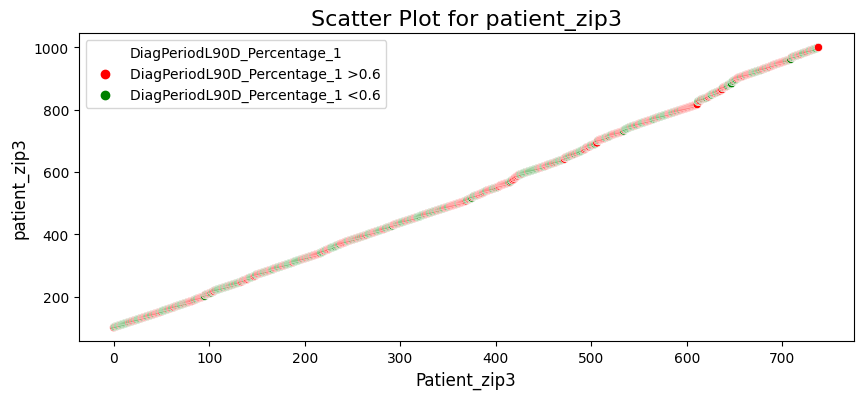

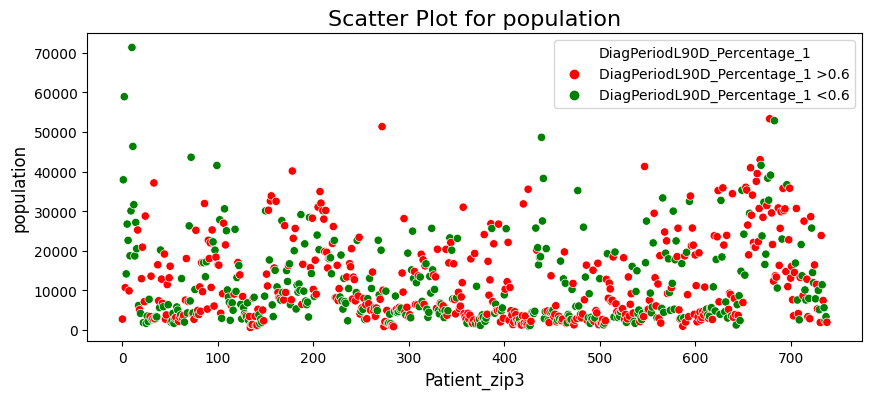

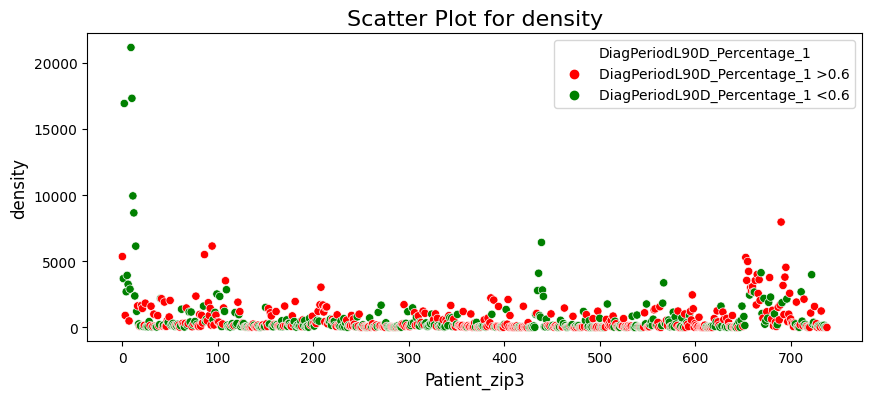

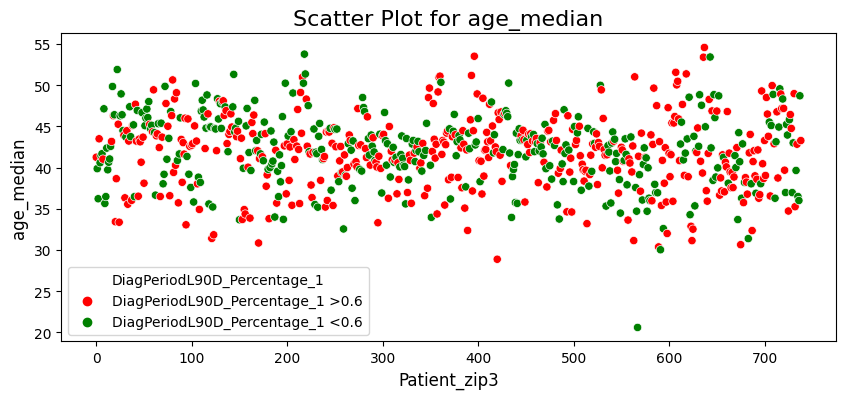

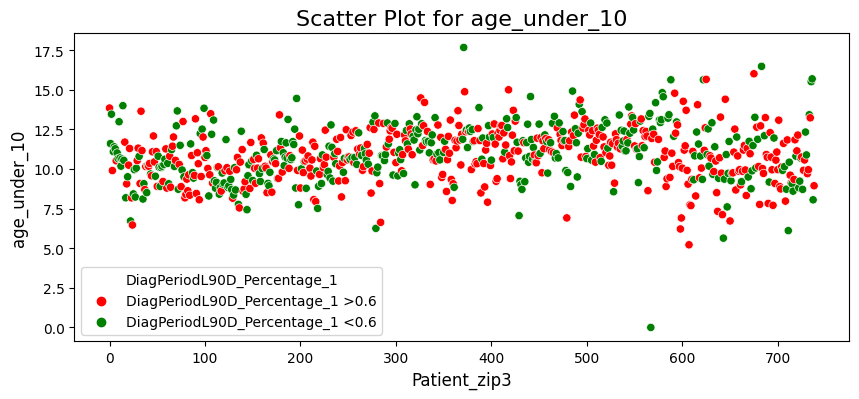

...

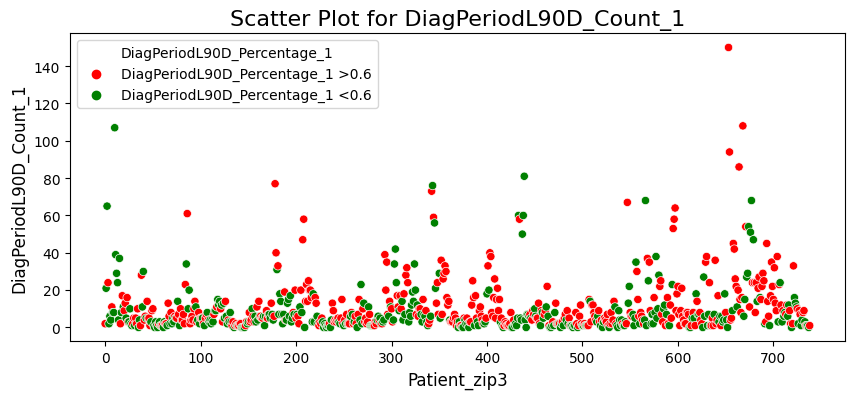

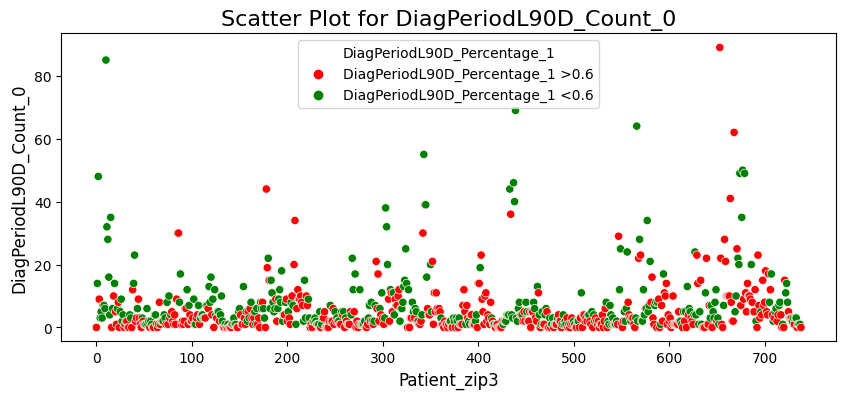

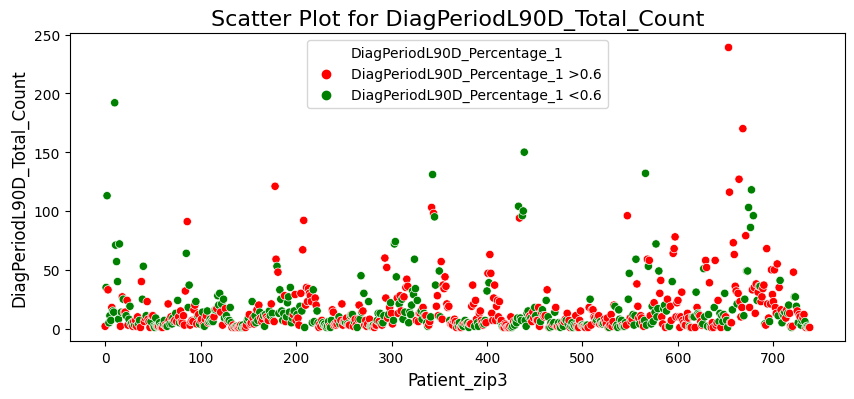

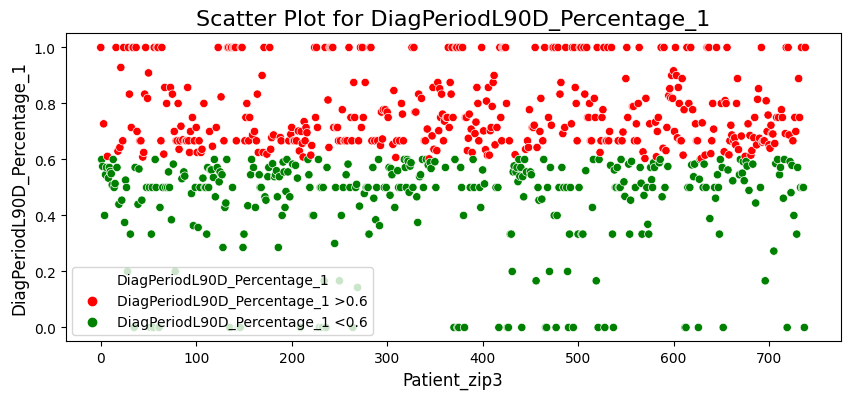

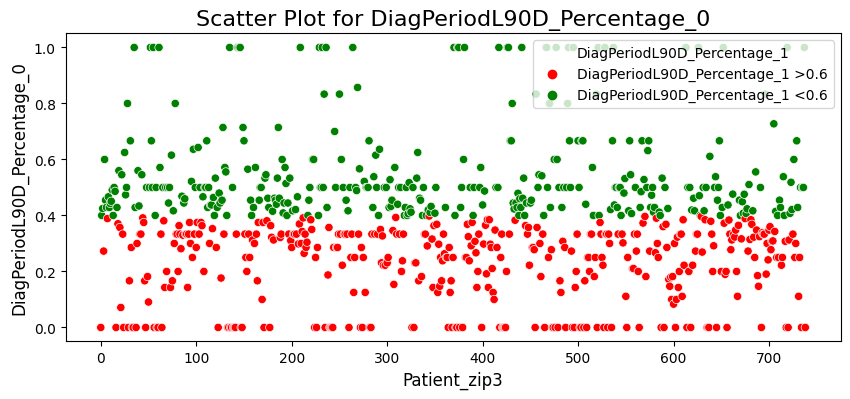

In [14]:
#Plot charts of numerical feature by zip codes to see if there is a pattern where 'DiagPeriodL90D_Percentage_1' > 0.6 meaning more than 60% of those receive a diagnosis in 90 days compare to other zip codes

plot_num_data = train_demo_grouped[numerical_features]

# Define a custom color mapping function
def custom_color_map(value):
    if value > 0.6:
        return 'DiagPeriodL90D_Percentage_1 >0.6'
    else:
        return 'DiagPeriodL90D_Percentage_1 <0.6'

def scatter_plot(var, plot_num_data):
    plt.figure(figsize=(10, 4))
    sns.scatterplot(
        x=plot_num_data.index, 
        y=var, 
        hue=plot_num_data['DiagPeriodL90D_Percentage_1'].apply(custom_color_map),
        palette={'DiagPeriodL90D_Percentage_1 >0.6': 'red',  'DiagPeriodL90D_Percentage_1 <0.6': 'green'},  # Custom color palette
        data=plot_num_data,
        legend='full'  # Show legend with custom colors
    )
    plt.title(f'Scatter Plot for {var}', fontsize=16)
    plt.xlabel('Patient_zip3', fontsize=12)
    plt.ylabel(var, fontsize=12)
    plt.show()

# Loop through numerical variables and plot scatter charts
for column in plot_num_data.columns:
    scatter_plot(column, plot_num_data)


In [15]:
import geopandas as gpd

gdf = gpd.read_file('/kaggle/input/usa-3-digit-zip-shape-file/three_dig_zips/three_dig_zips.shp')
gdf.head(1)

,3dig_zip,geometry
0,032,"POLYGON ((-71.66777 43.15253, -71.63490 43.03357, -71.76297 43.01415, -71.76531 43.02255, -71.78069 43.01962, -71.78605 43.03861, -71.87953 43.03217, -71.89846 43.04010, -71.91161 43.05132, -71.91503 43.09514, -71.90858 43.10367, -71.92416 43.10216, -71.92575 43.11254, -71.94356 43.11189, -71.93495 43.10504, -71.94153 43.09912, -72.04350 43.08199, -72.03408 43.12875, -72.17850 43.13187, -72.15666 43.18197, -72.12768 43.18553, -72.12346 43.24953, -72.06335 43.24914, -72.09015 43.32255, -72.05119 43.37648, -72.04681 43.41086, -72.05804 43.42325, -72.05375 43.44110, -72.07890 43.44609, -72.10247 43.46740, -72.09180 43.51690, -72.06241 43.53509, -72.05914 43.54117, -72.06952 43.55317, -72.00578 43.62744, -71.90008 43.60571, -71.89249 43.62068, -71.90380 43.62505, -71.89864 43.63165, -71.90894 43.63561, -71.90493 43.65122, -71.91054 43.65334, -71.88540 43.69607, -72.05813 43.73724, -72.02697 43.83794, -71.96378 43.90653, -71.96857 43.91946, -71.95920 43.91662, -71.96326 43.99816, -71.82193 43.98362, -71.79139 44.07838, -71.77236 44.07145, -71.72714 44.15856, -71.58151 44.11207, -71.53762 44.19750, -71.42422 44.17009, -71.42742 44.15009, -71.40192 44.12855, -71.40208 44.11422, -71.48431 44.07674, -71.49118 44.05018, -71.48350 44.04081, -71.49197 44.02155, -71.45734 44.01644, -71.44058 44.02221, -71.42391 44.00570, -71.37885 43.99812, -71.35027 43.86930, -71.36584 43.86402, -71.35662 43.85837, -71.36386 43.85560, -71.35009 43.83659, -71.36904 43.81552, -71.36197 43.82002, -71.35404 43.81441, -71.33949 43.82390, -71.32883 43.78273, -71.24532 43.77039, -71.32990 43.68782, -71.30527 43.67722, -71.30082 43.66116, -71.32551 43.65291, -71.32285 43.64726, -71.33393 43.64057, -71.33140 43.62768, -71.34425 43.62922, -71.33265 43.58005, -71.31269 43.57456, -71.31347 43.56396, -71.32879 43.56559, -71.31067 43.47753, -71.32297 43.47612, -71.30986 43.46213, -71.32473 43.46312, -71.35429 43.44305, -71.39784 43.46164, -71.38324 43.43907, -71.39596 43.43221, -71.36145 43.42497, -71.36269 43.41621, -71.33212 43.40868, -71.35364 43.37298, -71.33694 43.35764, -71.28110 43.41837, -71.15936 43.35512, -71.18639 43.33045, -71.18086 43.32324, -71.18898 43.31661, -71.18527 43.31118, -71.20319 43.31557, -71.24661 43.27476, -71.02669 43.13795, -71.07294 43.08168, -71.13065 43.08017, -71.14054 43.06428, -71.21295 43.07698, -71.18968 43.10966, -71.20641 43.11230, -71.18855 43.13176, -71.17287 43.12157, -71.15953 43.13556, -71.17720 43.14397, -71.15674 43.16694, -71.25752 43.18409, -71.25240 43.19262, -71.26878 43.20236, -71.26006 43.21299, -71.28099 43.21854, -71.35612 43.10204, -71.46595 43.11758, -71.46443 43.13980, -71.49501 43.15832, -71.49641 43.16895, -71.48797 43.17053, -71.50283 43.17661, -71.49055 43.18401, -71.50003 43.20128, -71.47541 43.20362, -71.48129 43.21756, -71.46221 43.23562, -71.46331 43.24461, -71.45036 43.24493, -71.43315 43.26041, -71.35922 43.34377, -71.36193 43.35333, -71.47145 43.41130, -71.48073 43.40910, -71.47479 43.39600, -71.48871 43.38678, -71.46454 43.36304, -71.52490 43.30266, -71.52957 43.30947, -71.58836 43.28737, -71.58587 43.30283, -71.60359 43.30419, -71.59377 43.31429, -71.61781 43.31755, -71.61507 43.32812, -71.62683 43.32622, -71.63246 43.35298, -71.65198 43.37375, -71.64831 43.38536, -71.78610 43.33427, -71.72345 43.24095, -71.66800 43.26014, -71.60296 43.16511, -71.66777 43.15253), (-71.61382 43.99647, -71.57125 43.89845, -71.56549 43.91074, -71.51101 43.94082, -71.52061 43.98593, -71.55284 43.98119, -71.59453 43.99825, -71.61382 43.99647))"


In [16]:
train_demo_grouped['patient_zip3'] = train_demo_grouped['patient_zip3'].astype(str)

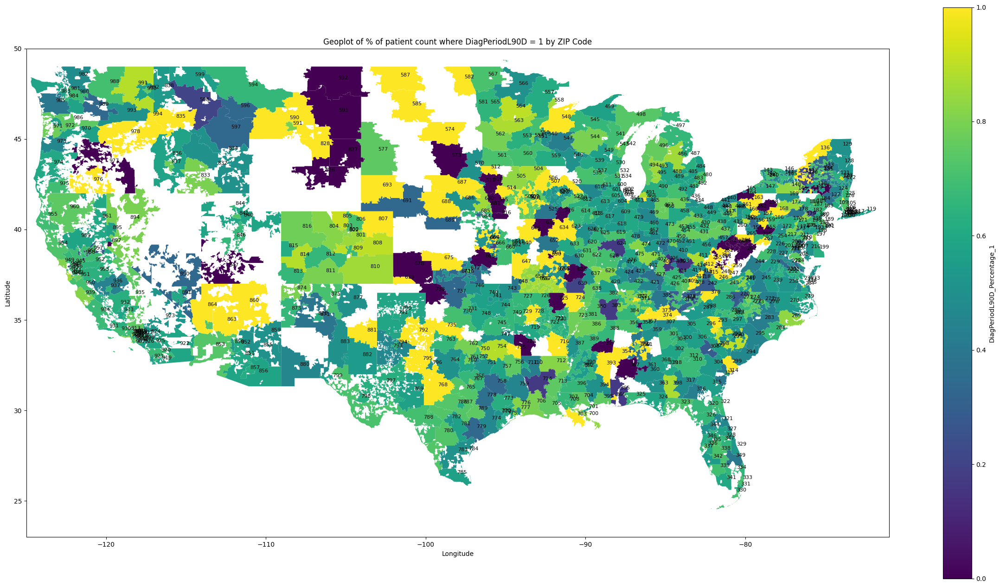

In [17]:
# addMerge the zip code boundaries with your data
merged_data = gdf.merge(train_demo_grouped, left_on='3dig_zip', right_on='patient_zip3')

# Create a scatter plot on the map
fig, ax = plt.subplots(figsize=(30, 16))
merged_data.plot(column='DiagPeriodL90D_Percentage_1', ax=ax, legend=True,
                 legend_kwds={'label': "DiagPeriodL90D_Percentage_1", 'orientation': "vertical"})
ax.set_title("Geoplot of % of patient count where DiagPeriodL90D = 1 by ZIP Code")
plt.xlabel('Longitude')
plt.ylabel('Latitude')
ax.set_xlim([-125, -71])  # Set longitude axis limits
ax.set_ylim([23, 50])    # Set latitude axis limits

# Add labels for patient_zip3
for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data['patient_zip3']):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords='offset points', fontsize=8)

# Show the map
plt.show()


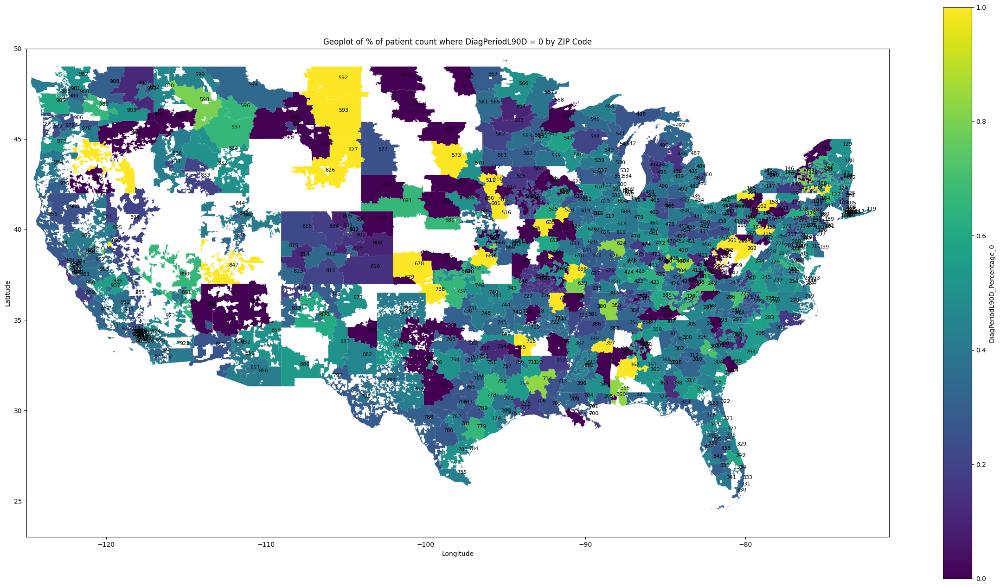

In [18]:
# Create a scatter plot on the map
fig, ax = plt.subplots(figsize=(30, 16))
merged_data.plot(column='DiagPeriodL90D_Percentage_0', ax=ax, legend=True,
                 legend_kwds={'label': "DiagPeriodL90D_Percentage_0", 'orientation': "vertical"})
ax.set_title("Geoplot of % of patient count where DiagPeriodL90D = 0 by ZIP Code")
plt.xlabel('Longitude')
plt.ylabel('Latitude')
ax.set_xlim([-125, -71])  # Set longitude axis limits
ax.set_ylim([23, 50])    # Set latitude axis limits

# Add labels for patient_zip3
for x, y, label in zip(merged_data.geometry.centroid.x, merged_data.geometry.centroid.y, merged_data['patient_zip3']):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords='offset points', fontsize=8)

# Show the map
plt.show()


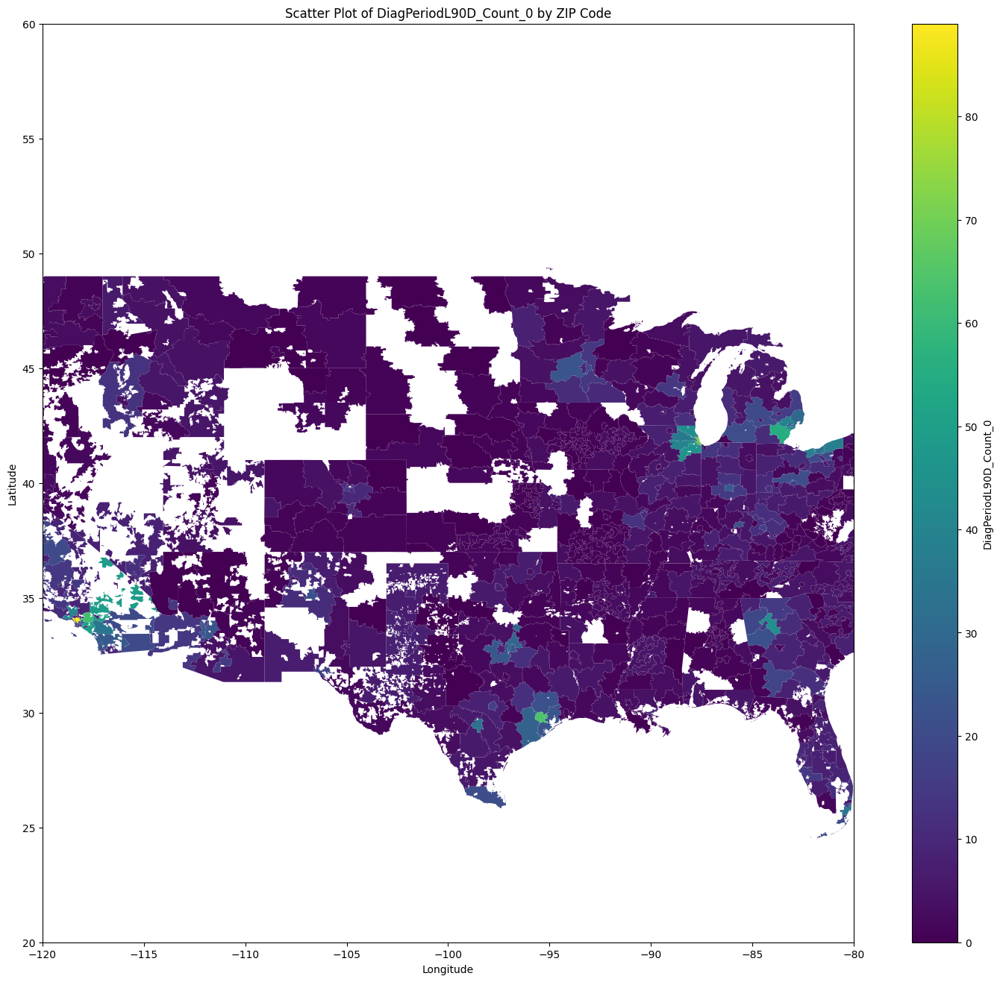

In [19]:

# Define a custom color mapping function
def custom_color_map(value):
    if value > 0.6:
        return 'DiagPeriodL90D_Percentage_1 >0.6'
    else:
        return 'DiagPeriodL90D_Percentage_1 <0.6'

# Create a scatter plot on the map
fig, ax = plt.subplots(figsize=(20, 16))
merged_data.plot(column='DiagPeriodL90D_Count_0', ax=ax, legend=True,
                   legend_kwds={'label': "DiagPeriodL90D_Count_0", 'orientation': "vertical"})
ax.set_title("Scatter Plot of DiagPeriodL90D_Count_0 by ZIP Code")
plt.xlabel('Longitude')
plt.ylabel('Latitude')
ax.set_xlim([-120, -80])  # Set longitude axis limits
ax.set_ylim([20, 60])    # Set latitude axis limits

# Show the map
plt.show()



#### Pairplots of numerical feature

In [20]:
pp_cols = ['patient_zip3', 'population', 'density', 'age_median', 'male', 'female', 'married', 'divorced',
       'never_married', 'widowed', 'family_size', 'family_dual_income',
       'income_household_median', 'income_individual_median',
       'home_ownership', 'housing_units', 'home_value', 'rent_median',
       'rent_burden',
       'labor_force_participation', 'unemployment_rate', 'self_employed',
       'farmer', 'hispanic', 'disabled',
       'poverty', 'limited_english', 'commute_time', 'health_uninsured',
       'veteran', 'Ozone', 'PM25', 'N02', 'DiagPeriodL90D_Count_1',
       'DiagPeriodL90D_Count_0', 'DiagPeriodL90D_Total_Count',
       'DiagPeriodL90D_Percentage_1', 'DiagPeriodL90D_Percentage_0']

#### Correlation matrix

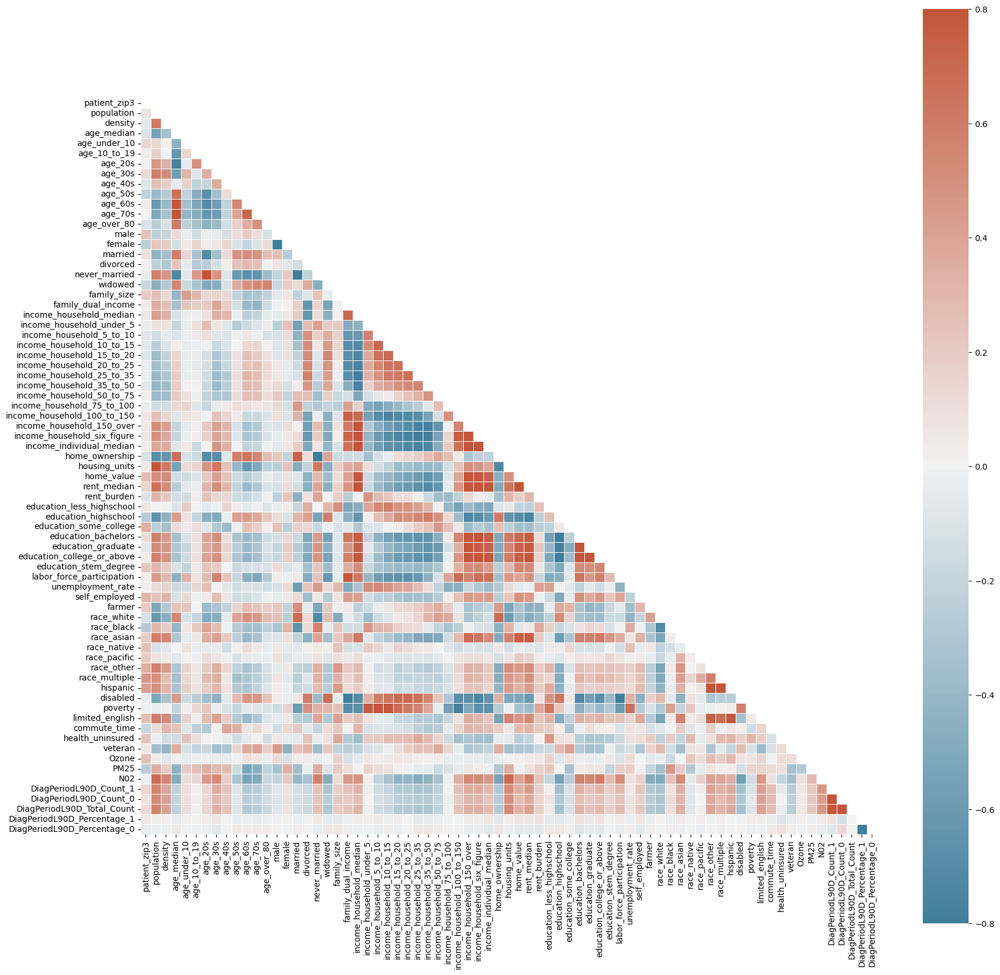

In [21]:
# Calculate correlation matrix
corr = train_demo_grouped[numerical_features].corr() # method='pearson', 'kendall' , 'spearman'

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure with a larger size
f, ax = plt.subplots(figsize=(20, 20))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
heatmap = sns.heatmap(corr, mask=mask, cmap=cmap, vmin=-0.8, vmax=0.8, square=True, linewidths=.5)

# Increase font size for better readability
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=90, fontsize=10)
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=10)

plt.show()
